In [1]:
import numpy as np
import loompy
import numpy as np
import pandas as pd
import scanpy as sc
import scipy as sp
import matplotlib.pyplot as plt
import glob
import bbknn
import seaborn as sns
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))
%matplotlib inline

import scvelo as scv
scv.logging.print_version()

Running scvelo 0.2.1 (python 3.7.6) on 2020-09-02 19:13.
 Your version: 		 0.2.1 
 Latest version: 	 0.2.2


In [2]:
sc.settings.set_figure_params(dpi=140)

In [3]:
adata1 = sc.read_loom(
    'F:\Sequence\ImportantREnvironments\FinalEnvironments\P2P21CellCount03.loom',
    sparse=True, cleanup=False, X_name='spliced',
obs_names='CellID',
var_names='Gene', dtype='float32')   

adata2 = sc.read_loom(
   'F:\Sequence\ImportantREnvironments\FinalEnvironments\P2P21CellCount04.loom',
    sparse=True, cleanup=False, X_name='spliced',
obs_names='CellID',
var_names='Gene', dtype='float32')   

adata3 = sc.read_loom(
   'F:\Sequence\ImportantREnvironments\FinalEnvironments\P2P21CellCount05.loom',
    sparse=True, cleanup=False, X_name='spliced',
obs_names='CellID',
var_names='Gene', dtype='float32')   

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [6]:
adata1.var_names_make_unique()  # this is unnecessary if using 'gene_ids'

adata2.var_names_make_unique()  # this is unnecessary if using 'gene_ids'

adata3.var_names_make_unique()  # this is unnecessary if using 'gene_ids'

In [7]:
adata = adata1.concatenate(adata2,adata3, batch_key='Time', batch_categories=['batch1','batch2','batch3'])

In [8]:
adata

AnnData object with n_obs × n_vars = 7276 × 31045
    obs: 'Clusters', '_X', '_Y', 'Time'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

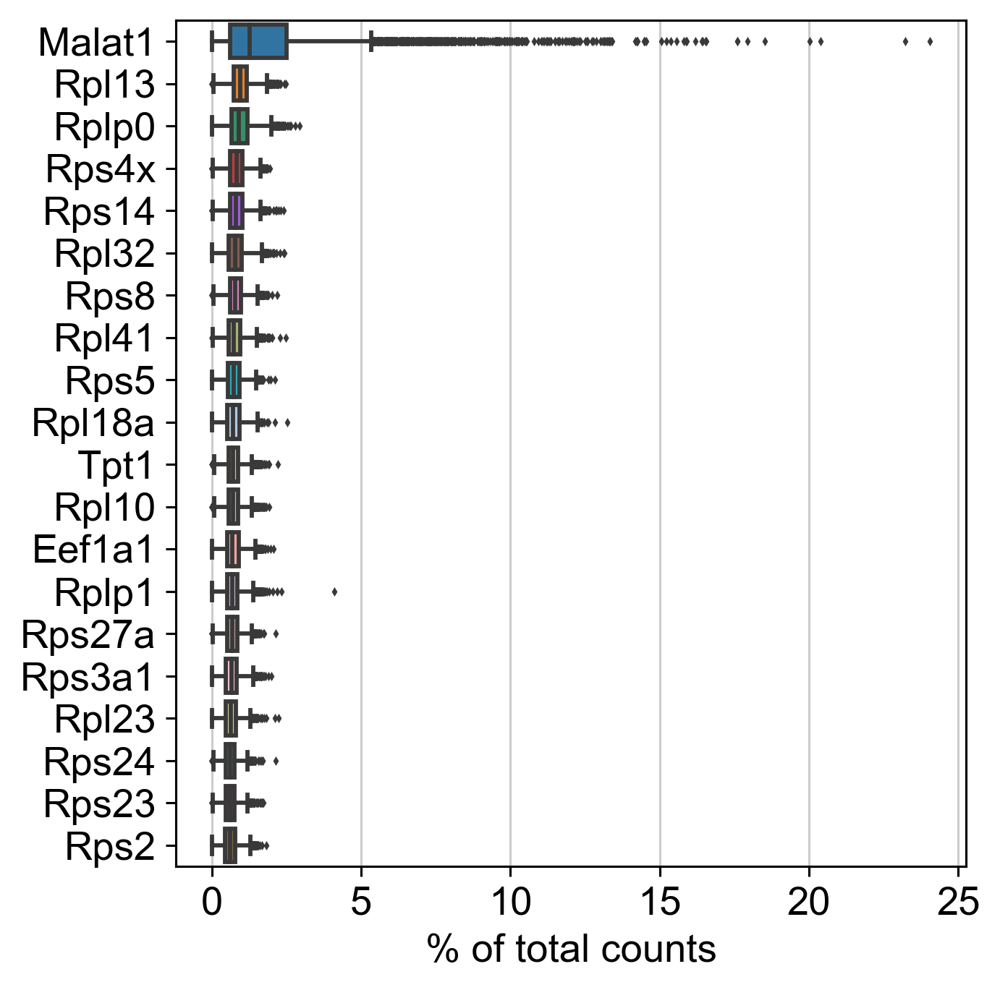

In [9]:
sc.pl.highest_expr_genes(adata, n_top=20)

In [10]:
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=3)

In [11]:
mito_genes = adata.var_names.str.startswith('mt-')
# for each cell compute fraction of counts in mito genes vs. all genes
# the `.A1` is only necessary as X is sparse (to transform to a dense array after summing)
adata.obs['percent_mito'] = np.sum(
    adata[:, mito_genes].X, axis=1).A1 / np.sum(adata.X, axis=1).A1
# add the total counts per cell as observations-annotation to adata
adata.obs['n_counts'] = adata.X.sum(axis=1).A1

... storing 'Chromosome' as categorical
... storing 'Strand' as categorical


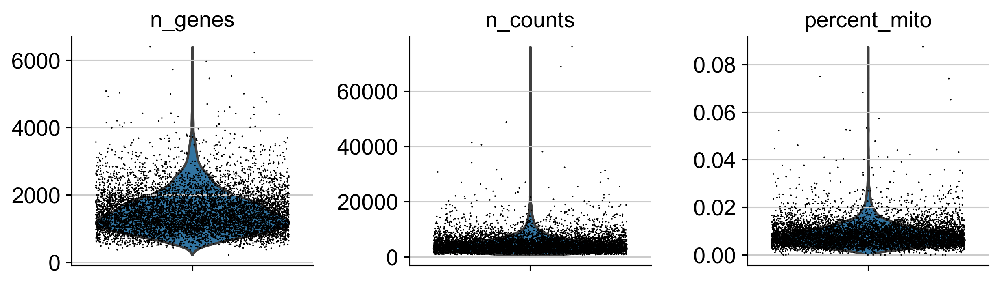

In [12]:
sc.pl.violin(adata, ['n_genes', 'n_counts','percent_mito'],
             jitter=0.4, multi_panel=True)

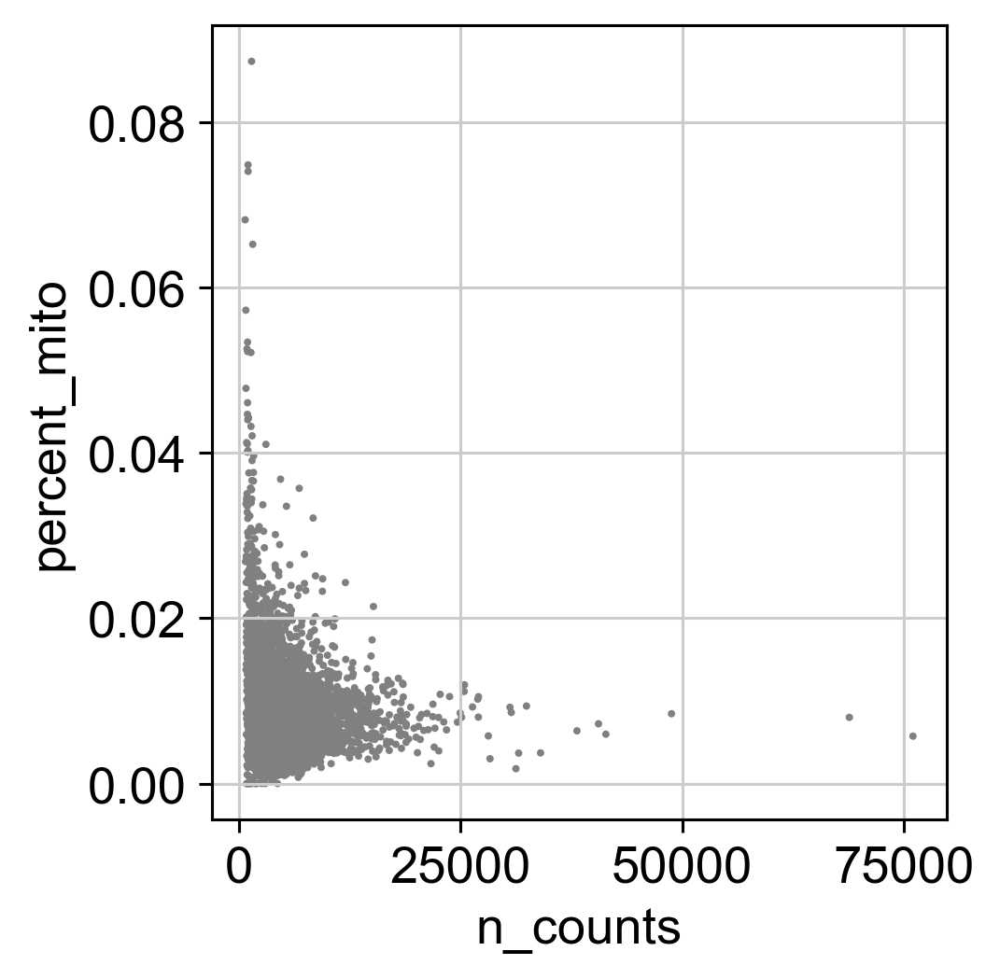

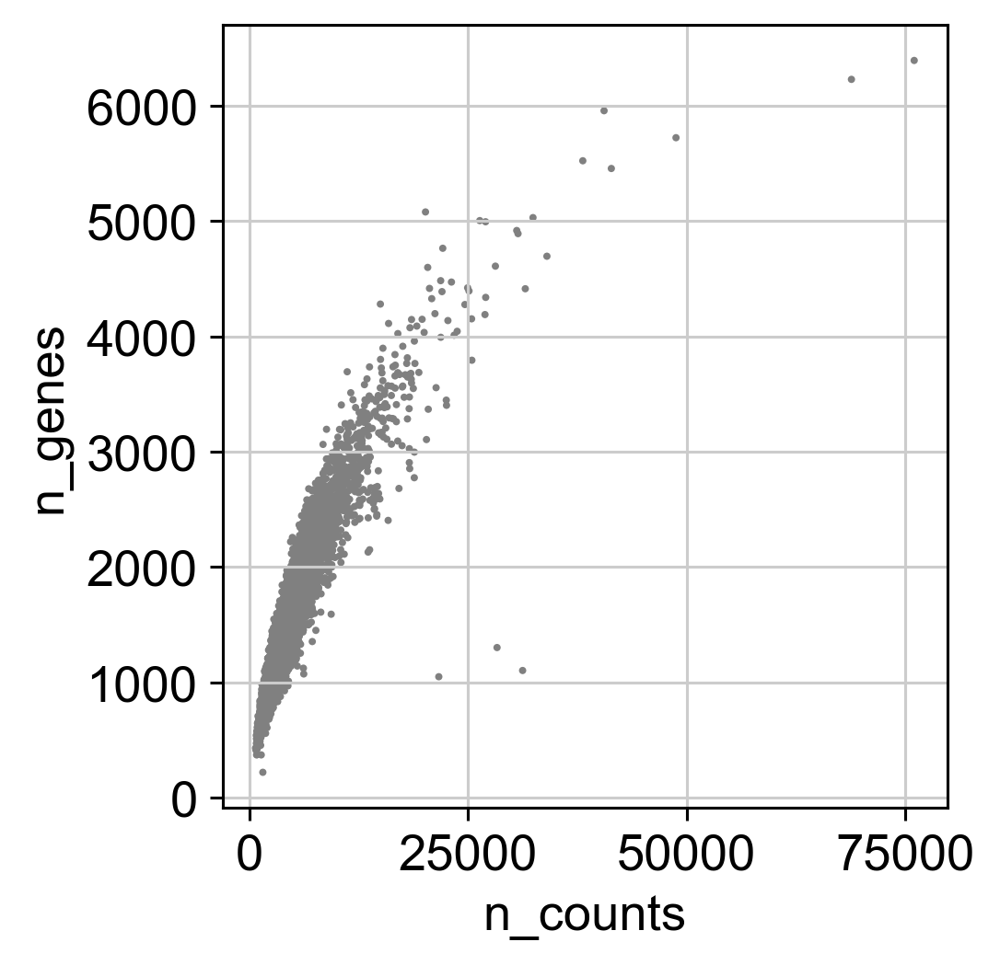

In [13]:
sc.pl.scatter(adata, x='n_counts', y='percent_mito')
sc.pl.scatter(adata, x='n_counts', y='n_genes')

In [14]:
adata

AnnData object with n_obs × n_vars = 7233 × 17272
    obs: 'Clusters', '_X', '_Y', 'Time', 'n_genes', 'percent_mito', 'n_counts'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'n_cells'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

In [15]:
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)

In [16]:
sc.pp.log1p(adata)

In [17]:
adata.raw = adata

In [18]:
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)

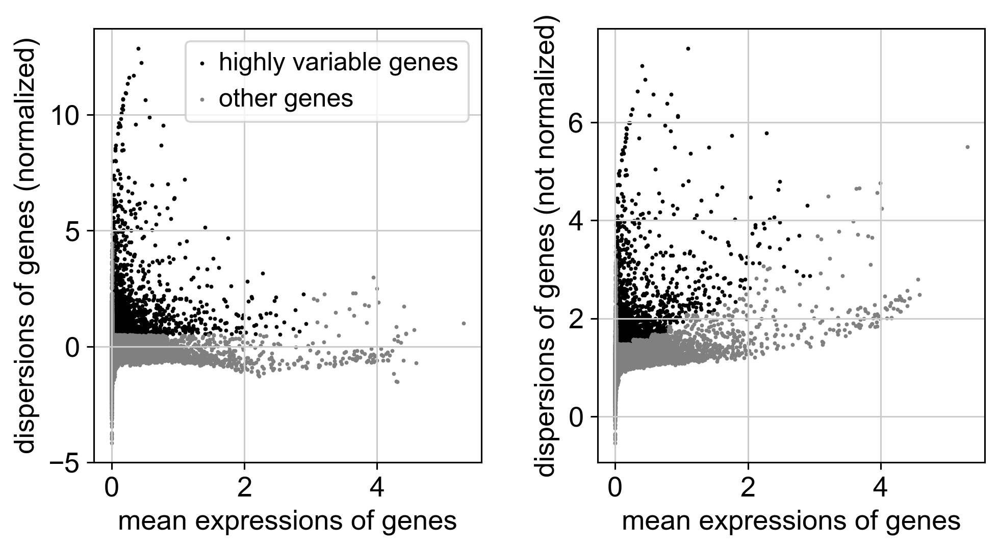

In [19]:
sc.pl.highly_variable_genes(adata)

In [20]:
adata = adata[:, adata.var['highly_variable']]

In [21]:
sc.pp.regress_out(adata, ['n_counts', 'percent_mito'])

In [22]:
sc.pp.scale(adata, max_value=10)

In [23]:
sc.tl.pca(adata, svd_solver='arpack')

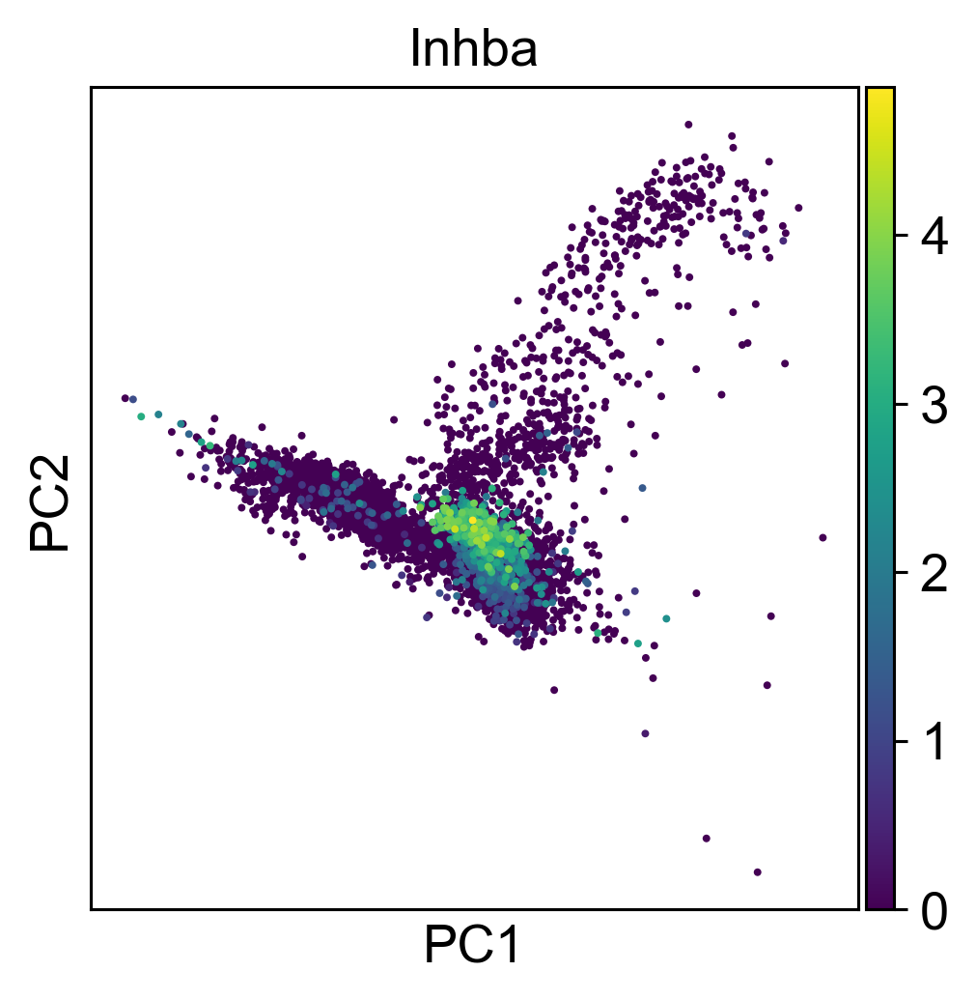

In [24]:
sc.pl.pca(adata, color='Inhba')

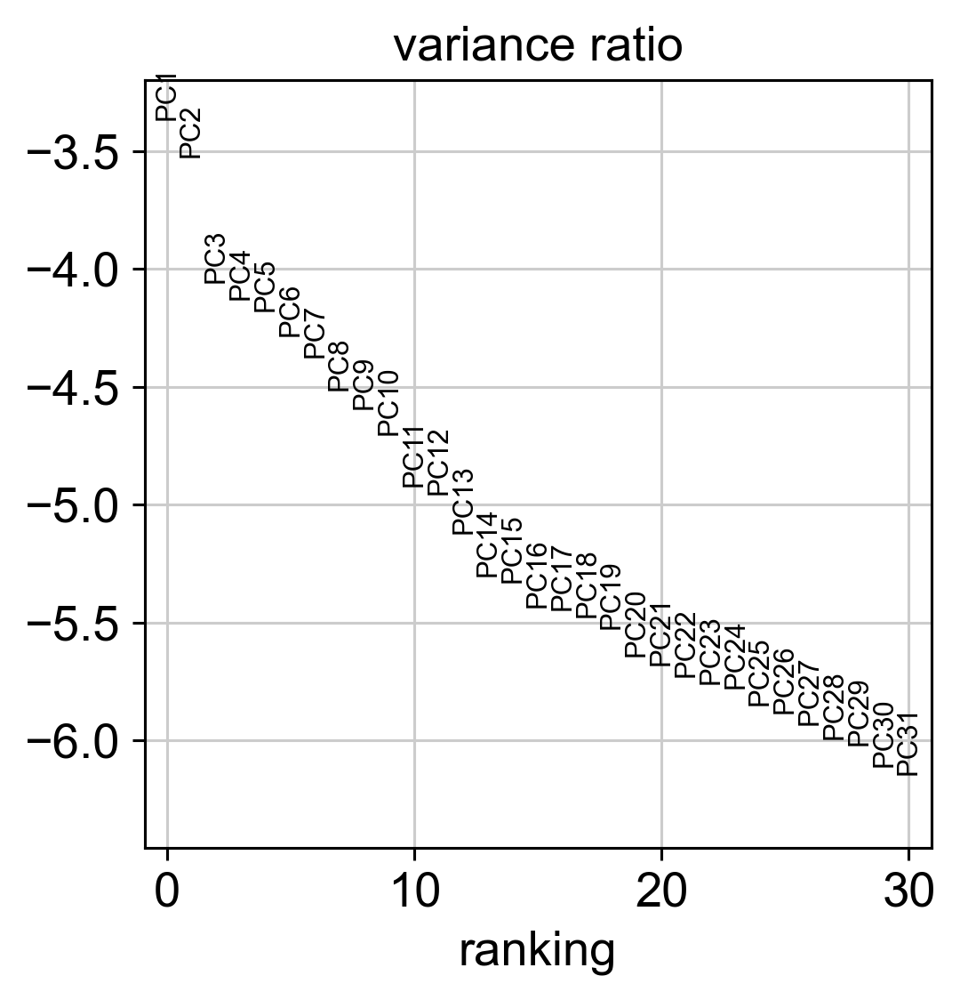

In [25]:
sc.pl.pca_variance_ratio(adata, log=True)

In [26]:
adata

AnnData object with n_obs × n_vars = 7233 × 1874
    obs: 'Clusters', '_X', '_Y', 'Time', 'n_genes', 'percent_mito', 'n_counts'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

In [27]:
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40)

In [28]:
sc.tl.umap(adata)

In [4]:
marker_genes = ['Krt14', 'Krt15','Krt17','Krt79','Tyrobp','Lyz2','Ptprc','Dct',
                'Vim','Pdgfra','Twist2','En1','Inhba','Plp1','Mbp','Rgs5','Acta2','Pecam1'
                 ]

In [5]:
sc.pl.umap(adata, color=marker_genes)

NameError: name 'adata' is not defined

In [31]:
sc.tl.leiden(adata, resolution=0.1)

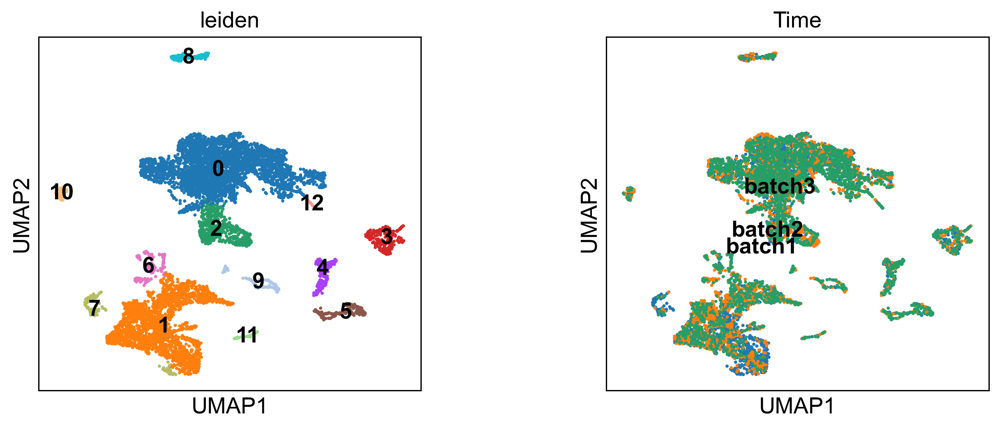

In [32]:
sc.pl.umap(adata, color=['leiden','Time'], legend_loc='on data', wspace=0.35)

In [33]:
#####SUBSETTING THE DATA#####

In [34]:
adata_subset = adata[adata.obs['leiden'].isin(
    ['2','0','12'])]

In [35]:
adata_subset

View of AnnData object with n_obs × n_vars = 3943 × 1874
    obs: 'Clusters', '_X', '_Y', 'Time', 'n_genes', 'percent_mito', 'n_counts', 'leiden'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'Time_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'
    obsp: 'distances', 'connectivities'

In [36]:
sc.tl.pca(adata_subset, svd_solver='arpack')

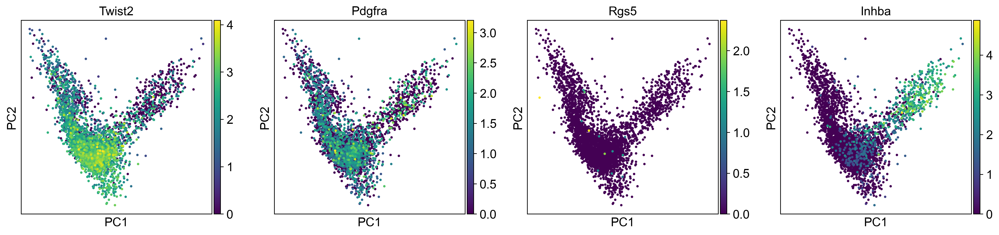

In [37]:
sc.pl.pca(adata_subset, color=['Twist2', 'Pdgfra', 'Rgs5','Inhba'])

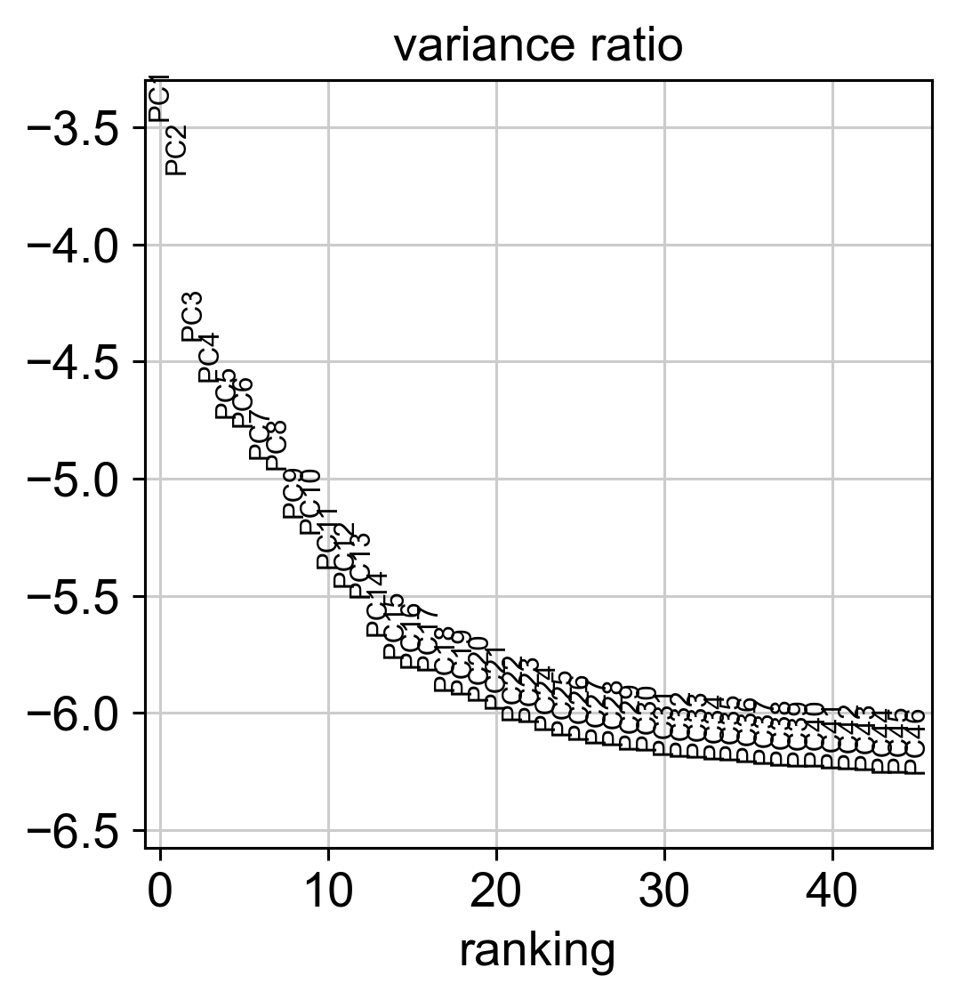

In [38]:
sc.pl.pca_variance_ratio(adata_subset, n_pcs=45, log=True)

In [39]:
#bdata = bbknn.bbknn(adata_subset,batch_key='Time',copy=True)

In [40]:
sc.tl.umap(adata_subset, min_dist=0.25, spread=2)

In [41]:
sc.pp.neighbors(adata_subset, n_neighbors=20, n_pcs=20)

In [42]:
sc.tl.umap(adata_subset)

In [43]:
sc.tl.leiden(adata_subset)

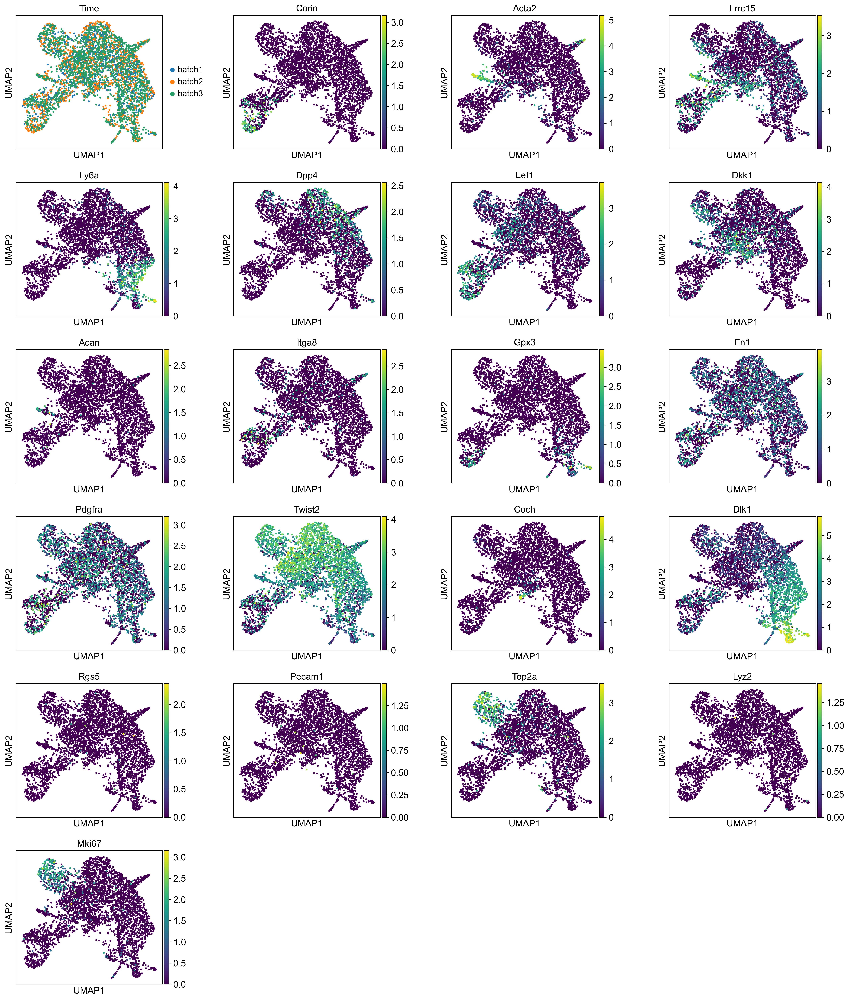

In [44]:
sc.pl.umap(adata_subset, color=['Time','Corin','Acta2','Lrrc15','Ly6a','Dpp4','Lef1','Dkk1','Acan','Itga8',
                        'Gpx3','En1','Pdgfra','Twist2','Coch','Dlk1','Rgs5','Pecam1','Top2a','Lyz2',
                        'Mki67'], 
           color_map= 'viridis',
           wspace=0.35)

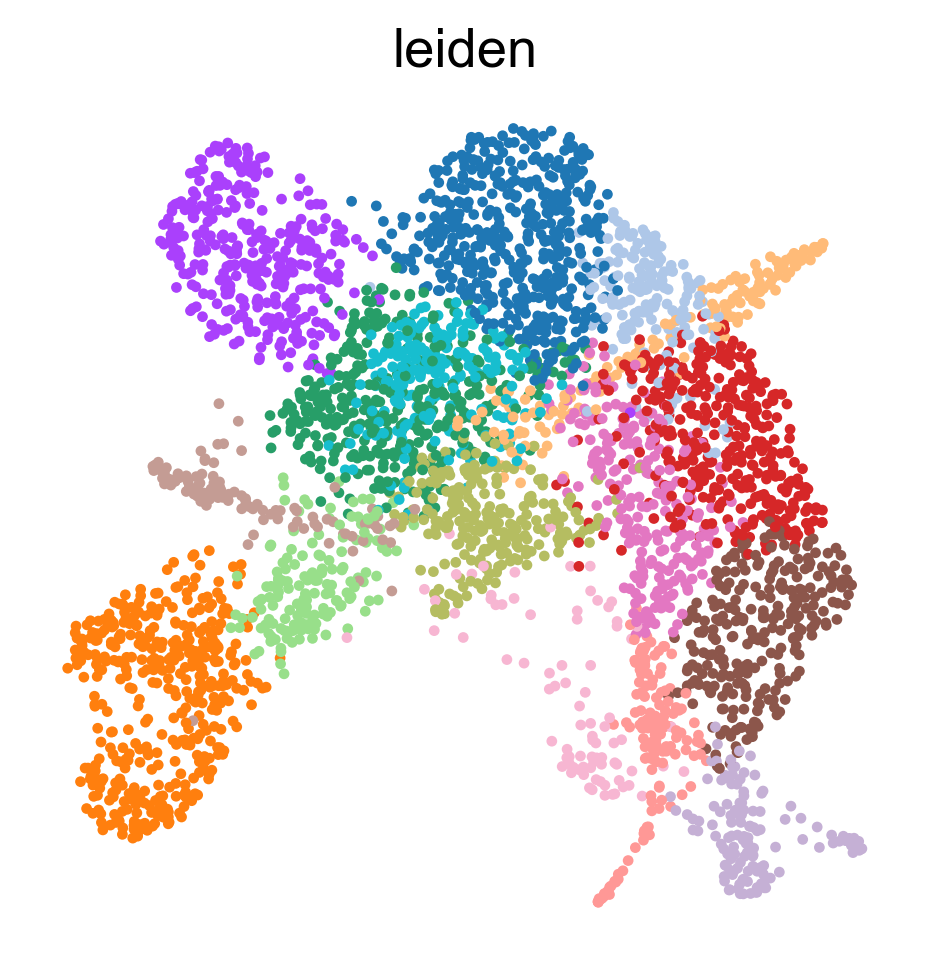

In [50]:
sc.pl.umap(adata_subset, color='leiden', legend_loc='none', legend_fontsize='4.0',
           frameon=False)

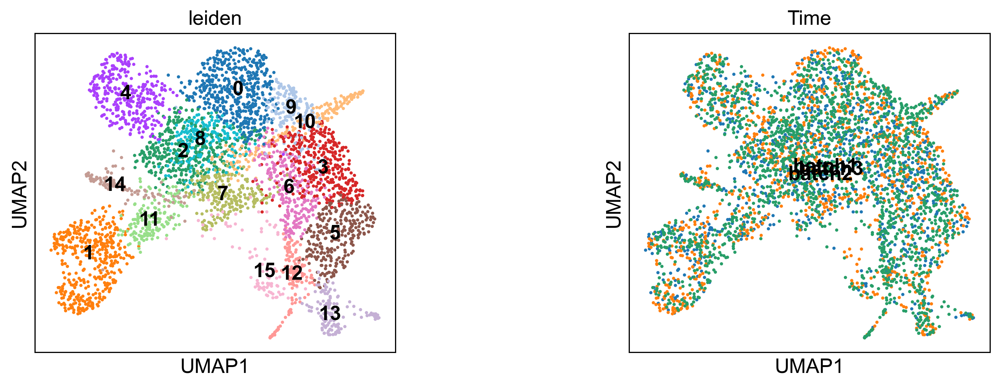

In [52]:
sc.pl.umap(adata_subset, color=['leiden','Time'], legend_loc='on data', wspace=0.5, size=20)